## Assignment 8

By Bhawana Agarwal, Cheril Yogi, Tripti Gupta

### COCO Dataset

Importing the necessary packages

In [129]:
%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import sys
import os
import pickle
from PIL import Image
#from cache import cache
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, GRU, Embedding
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [3]:
import requests
import zipfile
import os

In [4]:
#pip install docopt

In [5]:
#pip install clint

In [6]:
#pip install tablib

In [7]:
#pip install pycocotools

In [8]:
from pycocotools.coco import COCO as co

In [9]:
dir_path = os.getcwd()

# Do not run if file is already downloaded

 Downloading file from the given URL and save it to the specified target path.

In [10]:
def download_file(url, target_path):
    response = requests.get(url, stream=True)
    with open(target_path, "wb") as file:
        for chunk in response.iter_content(chunk_size=8192):
            if chunk:
                file.write(chunk)

Extracts the contents of a ZIP file

In [11]:
def extract_zip(file_path, extract_to):
    with zipfile.ZipFile(file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

Dictionary containing URLs for different datasets

In [12]:
url_dictionary = {
    "image_url_train" : "http://images.cocodataset.org/zips/train2017.zip",
    "image_url_val" : "http://images.cocodataset.org/zips/val2017.zip",
    "annotations_url" : "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
}

Looping through the dictionary to download and extract the files. If file already exists then it will not download

In [14]:
pwd

'/Users/cherilyogi/Desktop/coco'

In [13]:
for url_name,url_path in url_dictionary.items():
    target_file = url_path.split('/')[-1]
    file_path_if_exist = os.path.join(dir_path,target_file)
    if not os.path.exists(file_path_if_exist):
        download_file(url_path, target_file)
        extract_zip(target_file, dir_path)
    else:
        print("The files you are trying to download already exists")

KeyboardInterrupt: 

In [12]:
# folders_name = ['annotations', "train2017", "val2017"]

In [19]:
from pathlib import Path

data_path = Path(os.path.join(dir_path,'train2017'))
# annotation_file_path = Path(os.path.join(dir_path,'annotations\\person_keypoints_train2017.json')
annotation_file_path = Path(os.path.join(dir_path, 'annotations', 'person_keypoints_train2017.json'))

In [20]:
type(data_path)

pathlib.PosixPath

Loading annotations to memory

In [22]:
coco = co(annotation_file_path)

loading annotations into memory...
Done (t=3.36s)
creating index...
index created!


In [23]:
image_ids = coco.getImgIds()
images_coco = coco.loadImgs(image_ids[-3:])
images_coco

[{'license': 3,
  'file_name': '000000516168.jpg',
  'coco_url': 'http://images.cocodataset.org/train2017/000000516168.jpg',
  'height': 480,
  'width': 640,
  'date_captured': '2013-11-25 21:03:34',
  'flickr_url': 'http://farm3.staticflickr.com/2379/2293730995_e2381ffa38_z.jpg',
  'id': 516168},
 {'license': 4,
  'file_name': '000000547503.jpg',
  'coco_url': 'http://images.cocodataset.org/train2017/000000547503.jpg',
  'height': 375,
  'width': 500,
  'date_captured': '2013-11-25 21:20:21',
  'flickr_url': 'http://farm1.staticflickr.com/178/423174638_1c6245ee20_z.jpg',
  'id': 547503},
 {'license': 4,
  'file_name': '000000475546.jpg',
  'coco_url': 'http://images.cocodataset.org/train2017/000000475546.jpg',
  'height': 375,
  'width': 500,
  'date_captured': '2013-11-25 21:20:23',
  'flickr_url': 'http://farm1.staticflickr.com/167/423175046_6cd9d0205a_z.jpg',
  'id': 475546}]

In [17]:
# pip install scikit-image

Displaying images in subplot

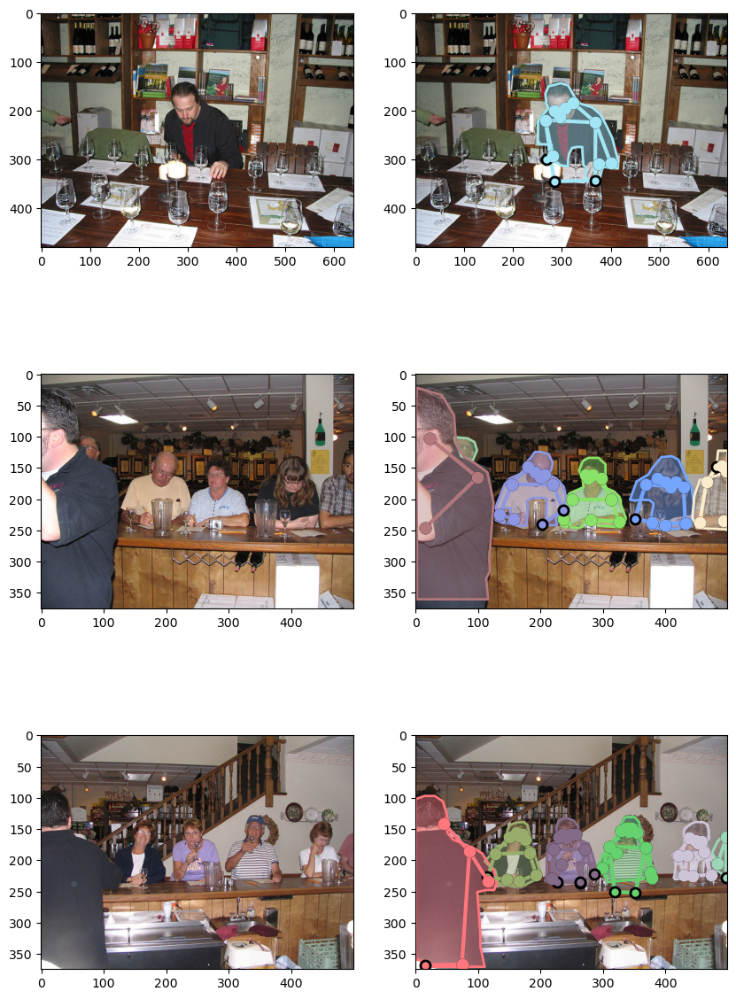

In [24]:
import skimage.io as io

_,axs = plt.subplots(len(images_coco),2,figsize=(10,5 * len(images_coco)))
for img, ax in zip(images_coco, axs):
    I = io.imread(data_path/img['file_name'])
    annotation_ids = coco.getAnnIds(imgIds=[img['id']])
    anns = coco.loadAnns(annotation_ids)
    ax[0].imshow(I)
    ax[1].imshow(I)
    plt.sca(ax[1])
    coco.showAnns(anns, draw_bbox=False)

How to show just the masks:

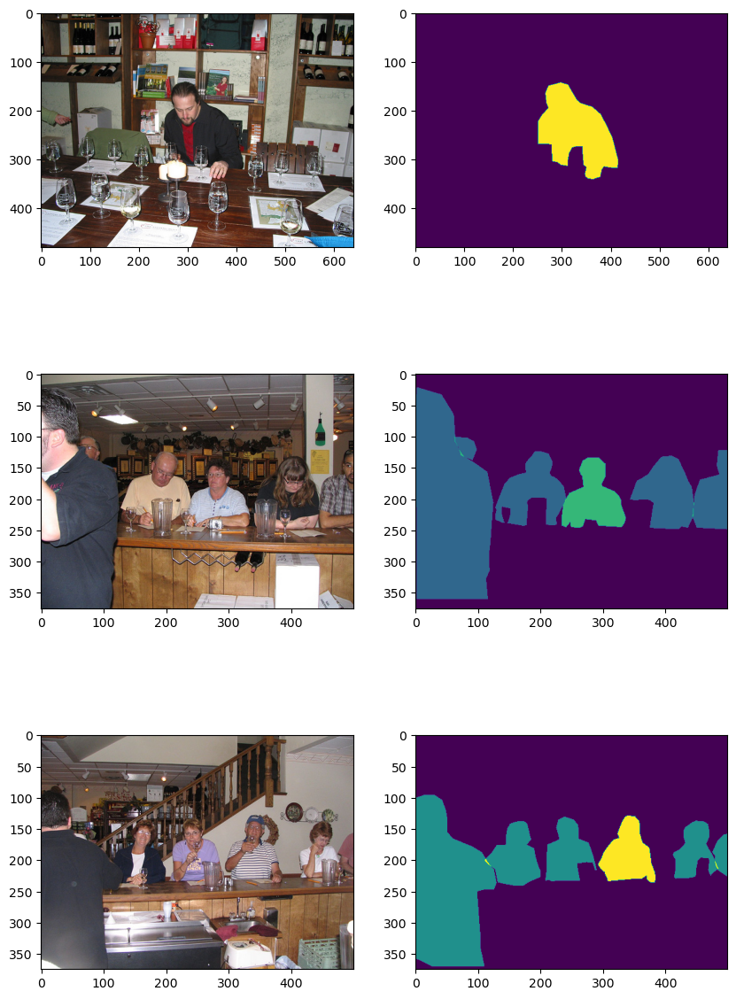

In [25]:
_,axs = plt.subplots(len(images_coco),2,figsize=(10,5 * len(images_coco)))
for img, ax in zip(images_coco, axs):
    I = io.imread(data_path/img['file_name'])
    annIds = coco.getAnnIds(imgIds=[img['id']])
    anns = coco.loadAnns(annIds)
    ax[0].imshow(I)
    
    mask = coco.annToMask(anns[0])
    for i in range(len(anns)):
        mask += coco.annToMask(anns[i])
        
    ax[1].imshow(mask)

In [26]:
for i in os.listdir(data_path):
    print(i)
    break

000000109622.jpg


In [27]:
images_coco[0]

{'license': 3,
 'file_name': '000000516168.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000516168.jpg',
 'height': 480,
 'width': 640,
 'date_captured': '2013-11-25 21:03:34',
 'flickr_url': 'http://farm3.staticflickr.com/2379/2293730995_e2381ffa38_z.jpg',
 'id': 516168}

In [28]:
training_images_filenames = [f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))]
training_images_filenames[:15], len(training_images_filenames)

(['000000109622.jpg',
  '000000160694.jpg',
  '000000308590.jpg',
  '000000327573.jpg',
  '000000062929.jpg',
  '000000512793.jpg',
  '000000371735.jpg',
  '000000148118.jpg',
  '000000309856.jpg',
  '000000141882.jpg',
  '000000318783.jpg',
  '000000337760.jpg',
  '000000298197.jpg',
  '000000042421.jpg',
  '000000328898.jpg'],
 118288)

In [29]:
annotations_captions_path = os.path.join(dir_path,"annotations\\captions_train2017.json")


Load captions data from a JSON file, extract annotations, and create a mapping of image IDs to corresponding captions.


In [30]:
import json
from os import listdir
from os.path import isfile, join

# Load the captions data from the uploaded file
with open('annotations/captions_train2017.json', 'r') as file:
    captions_data = json.load(file)

# Extract annotations
annotations = captions_data['annotations']
# Create a mapping of image IDs to captions
id_to_captions = {}
for annotation in annotations:
    image_id = annotation['image_id']
    caption = annotation['caption']
    if image_id not in id_to_captions:
        id_to_captions[image_id] = []
    id_to_captions[image_id].append(caption)

Create a mapping of training image filenames to their corresponding captions using the extracted numeric parts of the filenames as image IDs.

In [31]:
train_images_path = 'train2017/'
filenames_train = [f for f in listdir(train_images_path) if isfile(join(train_images_path, f))]
# print(filenames_train)
# Match these captions with the filenames
filenames_to_captions = {}
for filename in filenames_train:
    # Extracting the numeric part of the filename
    numeric_part = filename.split('.')[0].lstrip('0')
    
    # Check if the numeric part is a valid integer
    if numeric_part.isdigit():
        image_id = int(numeric_part)
        captions = id_to_captions.get(image_id, [])
        filenames_to_captions[filename] = captions

filenames_to_captions

{'000000109622.jpg': ['A bike parked in front of a metal bench.',
  'a bicycle sitting next to a park bench',
  'A bike that is next to a bench.',
  'bicycle handle bars in front of a park bench',
  'There are bike handlebars in front ot a bench.'],
 '000000160694.jpg': ['A soccer goalie punts the ball up field',
  'a guy about to kick a soccer ball.',
  'A soccer player kicks the ball in a soccer field',
  'Young soccer player getting ready to kick ball during game.',
  'A young man in a field is kicking a soccer ball.'],
 '000000308590.jpg': ['A man on a skateboard who is performing a trick.',
  'A skateboarder performing a trick at a skateboard park.',
  'A young man flying through the air while riding a skateboard.',
  'A shirtless skateboarder is attempting a trick. ',
  'a shirtless male skateboarder doing a trick and people'],
 '000000327573.jpg': ['two boys through a frisbee during a game on a field',
  'A group of young people playing a game of frisbee.',
  'A few young me in 

In [32]:
filenames_to_captions.get('000000109622.jpg')

['A bike parked in front of a metal bench.',
 'a bicycle sitting next to a park bench',
 'A bike that is next to a bench.',
 'bicycle handle bars in front of a park bench',
 'There are bike handlebars in front ot a bench.']

In [33]:
train_filenames = list(filenames_to_captions.keys())
train_captions = list(filenames_to_captions.values())
len(train_filenames), len(train_captions)

(118287, 118287)

Reading and doing the same for Validation dataset

In [36]:
val_images_path = 'val2017/'
filenames_val = [fl for fl in listdir(val_images_path) if isfile(join(val_images_path, fl))]
filenames_val[0:10]
 
# Load the captions data from the uploaded file
with open('annotations/captions_val2017.json', 'r') as val_file:
    val_captions_data = json.load(val_file)
 
    # Extract annotations
    val_annotations = val_captions_data['annotations']
 
 
# Create a mapping of image IDs to captions
val_id_to_captions = {}
for annotation_val in val_annotations:
    image_id_val = annotation_val['image_id']
    caption_val = annotation_val['caption']
    if image_id_val not in val_id_to_captions:
        val_id_to_captions[image_id_val] = []
    val_id_to_captions[image_id_val].append(caption_val)
 
    # Fetching the training images as per the user's script
    val_images_path = 'val2017/'
    filenames_val = [fl for fl in listdir(val_images_path) if isfile(join(val_images_path, fl))]
 
    # Match these captions with the filenames
    val_filenames_to_captions = {}
    for filename_val in filenames_val:  # Taking first 10 filenames as example
        # Extracting the numeric part of the filename
    #     print(filename_val)
        # Extracting the numeric part of the filename
        numeric_part = filename_val.split('.')[0].lstrip('0')

        # Check if the numeric part is a valid integer
        if numeric_part.isdigit():
            image_id_val = int(numeric_part)
            captions_val = val_id_to_captions.get(image_id_val, [])
            val_filenames_to_captions[filename_val] = captions_val

val_filenames_to_captions

{'000000182611.jpg': ['A man making his plate with a table full of food. ',
  'People serving themselves food from a buffet table in a private home.',
  'Two people with lots of food on a table and each has a plate',
  'A large bunch of food is on a kitchen table.',
  'A nman with tattos picks up food from a table.'],
 '000000335177.jpg': ['A round intersection on a surburban street with one floor homes.',
  'The view of a residential neighborhood with an abundance of trees.',
  'A white truck parked in a persons driveway',
  'a nice neighborhood with some green grass in it',
  'Suburban street scene showing a curve, houses, and cars in driveway.'],
 '000000278705.jpg': ['Two young men skate down an urban road.',
  'Two guys skateboarding down a graffiti lined street',
  'Skateboarders riding down the street on boards next to cars.',
  'This is an image through a window looking at two people on skateboards.',
  'Two young men riding skateboards on a street next to a graffiti covered wa

In [37]:
val_filenames = list(val_filenames_to_captions.keys())
val_captions = list(val_filenames_to_captions.values())
len(val_filenames), len(val_captions)

(5000, 5000)

Helper Functions

In [49]:
def load_image(path, size=None, im2=None, paste_position=(50, 125)):
    """
    Load the image from the given file-path and resize it
    to the given size if not None. Optionally paste another
    image and rotate.
    """
    # Load the image using PIL.
    img = Image.open(path)
    # Resize image if desired.
    if size is not None:
        img = img.resize(size, resample=Image.LANCZOS)
    # Paste another image if provided.
    if im2 is not None:
        img.paste(im2, paste_position)
    # Rotate 180 degrees counterclockwise.
#     img = img.rotate(180, Image.NEAREST, expand=1)
    # Convert image to numpy array.
    img = np.array(img)
    # Scale image-pixels to range [0.0, 1.0].
    img = img / 255.0
    # Convert 2-dim grayscale array to 3-dim RGB array.
    if len(img.shape) == 2:
        img = np.repeat(img[:, :, np.newaxis], 3, axis=2)

    return img

In [50]:
def show_image(idx, train):
    """
    Load and plot an image from the COCO dataset with the given index.
    """
    if train:
        # Use an image from the training-set.
        filename = training_images_filenames[idx]
        captions = id_to_captions.get(int(filename.split('.')[0].lstrip('0')), [])
    else:
        # Adjust as necessary for validation-set.
        filename = val_filenames[idx]
        caption = val_captions[idx]

    # Path for the image-file.
    path = os.path.join(train_images_path, filename)

    # Print the captions for this image.
    for caption in captions:
        print(caption)

    # Load the image and plot it.
    img = load_image(path)
    plt.imshow(img)
    plt.show()

### Showing an example of the image with caption

A group of people riding massive waves in the ocean.
A group of surfers are riding a wave in the ocean.
A view of a very large wave coming towards surfers
A large wave with some people on surfboards 
Surfers going down a gigantic ocean wave with onlookers. 


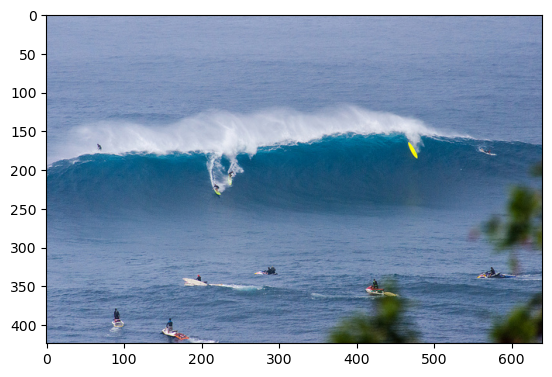

In [51]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
show_image(idx=4, train=True)

## Image Model

In [52]:
image_model = VGG16(include_top=True, weights='imagenet')

In [53]:
image_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [54]:
transfer_layer = image_model.get_layer('fc2')

We will use the output of the layer prior to the final classification-layer which is named fc2. This is a fully-connected (or dense) layer

We also need to create a new model which has the same input as the original VGG16 model but outputs the transfer-values from the fc2 layer.

In [55]:
image_model_transfer = Model(inputs=image_model.input,
                             outputs=transfer_layer.output)

In [56]:
img_size = K.int_shape(image_model.input)[1:3]
img_size

(224, 224)

In [57]:
transfer_values_size = K.int_shape(transfer_layer.output)[1]
transfer_values_size

4096

### Processing the images

#### Helper functions

In [58]:
def print_progress(count, max_count):
    # Percentage completion.
    pct_complete = count / max_count

    # Status-message. Note the \r which means the line should
    # overwrite itself.
    msg = "\r- Progress: {0:.1%}".format(pct_complete)

    # Print it.
    sys.stdout.write(msg)
    sys.stdout.flush()

This is the function for processing the given files using the pretrained VGG16-model and returning their transfer-values.

In [59]:
def process_images(data_dir, filenames, batch_size=32):
    """
    Process all the given files in the given data_dir using the
    pre-trained image-model and return their transfer-values.
    
    Note that we process the images in batches to save
    memory and improve efficiency on a GPU.
    """
    
    # Number of images to process.
    num_images = len(filenames)

    # Pre-allocate input-batch-array for images.
    shape = (batch_size,) + img_size + (3,)
    image_batch = np.zeros(shape=shape, dtype=np.float16)

    # Pre-allocate output-array for transfer-values.
    # Note that we use 16-bit floating-points to save memory.
    shape = (num_images, transfer_values_size)
    transfer_values = np.zeros(shape=shape, dtype=np.float16)

    # Initialize index into the filenames.
    start_index = 0

    # Process batches of image-files.
    while start_index < num_images:
        # Print the percentage-progress.
        print_progress(count=start_index, max_count=num_images)

        # End-index for this batch.
        end_index = start_index + batch_size

        # Ensure end-index is within bounds.
        if end_index > num_images:
            end_index = num_images

        # The last batch may have a different batch-size.
        current_batch_size = end_index - start_index

        # Load all the images in the batch.
        for i, filename in enumerate(filenames[start_index:end_index]):
            # Path for the image-file.
            path = os.path.join(data_dir, filename)

            # Load and resize the image.
            # This returns the image as a numpy-array.
            img = load_image(path, size=img_size)

            # Save the image for later use.
            image_batch[i] = img

        # Use the pre-trained image-model to process the image.
        # Note that the last batch may have a different size,
        # so we only use the relevant images.
        transfer_values_batch = \
            image_model_transfer.predict(image_batch[0:current_batch_size])

        # Save the transfer-values in the pre-allocated array.
        transfer_values[start_index:end_index] = \
            transfer_values_batch[0:current_batch_size]

        # Increase the index for the next loop-iteration.
        start_index = end_index

    # Print newline.
    print()

    return transfer_values

Caching the results for reusing them

In [60]:
def cache(cache_path, fn, *args, **kwargs):
    """
    Cache-wrapper for a function or class. If the cache-file exists
    then the data is reloaded and returned, otherwise the function
    is called and the result is saved to cache. The fn-argument can
    also be a class instead, in which case an object-instance is
    created and saved to the cache-file.
    :param cache_path:
        File-path for the cache-file.
    :param fn:
        Function or class to be called.
    :param args:
        Arguments to the function or class-init.
    :param kwargs:
        Keyword arguments to the function or class-init.
    :return:
        The result of calling the function or creating the object-instance.
    """

    # If the cache-file exists.
    if os.path.exists(cache_path):
        # Load the cached data from the file.
        with open(cache_path, mode='rb') as file:
            obj = pickle.load(file)

        print("- Data loaded from cache-file: " + cache_path)
    else:
        # The cache-file does not exist.

        # Call the function / class-init with the supplied arguments.
        obj = fn(*args, **kwargs)

        # Save the data to a cache-file.
        with open(cache_path, mode='wb') as file:
            pickle.dump(obj, file)

        print("- Data saved to cache-file: " + cache_path)

    return obj

In [61]:
def convert_numpy2pickle(in_path, out_path):
    """
    Convert a numpy-file to pickle-file.
    The first version of the cache-function used numpy for saving the data.
    Instead of re-calculating all the data, you can just convert the
    cache-file using this function.
    :param in_path:
        Input file in numpy-format written using numpy.save().
    :param out_path:
        Output file written as a pickle-file.
    :return:
        Nothing.
    """

    # Load the data using numpy.
    data = np.load(in_path)

    # Save the data using pickle.
    with open(out_path, mode='wb') as file:
        pickle.dump(data, file)

In [62]:
# This is the function that will only get called if the result
# is not already saved in the cache-file. This would normally
# be a function that takes a long time to compute
def expensive_function(a, b):
    return a * b

print('Computing expensive_function() ...')

# Either load the result from a cache-file if it already exists,
# otherwise calculate expensive_function(a=123, b=456) and
# save the result to the cache-file for next time.
result = cache(cache_path=os.path.join('cache_expensive_function.pkl'),
               fn=expensive_function, a=123, b=456)

print('result =', result)

Computing expensive_function() ...
- Data loaded from cache-file: cache_expensive_function.pkl
result = 56088


This is another example which saves an object to a cache-file.

In [63]:
# We want to cache an object-instance of this class.
# The motivation is to do an expensive computation only once,
# or if we need to persist the data for some other reason.
class ExpensiveClass:
    def __init__(self, c, d):
        self.c = c
        self.d = d
        self.result = c * d

    def print_result(self):
        print('c =', self.c)
        print('d =', self.d)
        print('result = c * d =', self.result)

print('Creating object from ExpensiveClass() ...')

# Either load the object from a cache-file if it already exists,
# otherwise make an object-instance ExpensiveClass(c=123, d=456)
# and save the object to the cache-file for the next time.
obj = cache(cache_path=os.path.join('cache_ExpensiveClass.pkl'),
            fn=ExpensiveClass, c=123, d=456)

obj.print_result()

Creating object from ExpensiveClass() ...
- Data loaded from cache-file: cache_ExpensiveClass.pkl
c = 123
d = 456
result = c * d = 56088


In [64]:
len(train_filenames), len(val_filenames)

(118287, 5000)

This is a helper-function for processing all images in the training-set. This saves the transfer-values in a cache-file for fast reloading.

In [65]:
def process_images_train():
    print("Processing {0} images in training-set ...".format(len(train_filenames)))

    cache_path = os.path.join(train_images_path, "transfer_values_train.pkl")

    # If the cache-file already exists then reload it,
    # otherwise process all images and save their transfer-values
    # to the cache-file so it can be reloaded quickly.
    # use this for coco
    transfer_values = cache(cache_path=cache_path,
                        fn=process_images,
                        data_dir=train_images_path,
                        filenames=train_filenames)

    return transfer_values

In [66]:
def process_images_val():
    print("Processing {0} images in validation-set ...".format(len(val_filenames)))

    # Path for the cache-file.
    cache_path = os.path.join(val_images_path, "transfer_values_val.pkl")

    # If the cache-file already exists then reload it,
    # otherwise process all images and save their transfer-values
    # to the cache-file so it can be reloaded quickly.
    transfer_values = cache(cache_path=cache_path,
                            fn=process_images,
                            data_dir=val_images_path,
                            filenames=val_filenames)

    return transfer_values

#### We now process all images in the training-set through VGG-16 and save the transfer-values to a cache-file. 


In [67]:
len(train_filenames)

118287

In [68]:
%%time
transfer_values_train = process_images_train()
print("dtype:", transfer_values_train.dtype)
print("shape:", transfer_values_train.shape)

Processing 118287 images in training-set ...
- Data loaded from cache-file: train2017/transfer_values_train.pkl
dtype: float16
shape: (118287, 4096)
CPU times: user 2.04 ms, sys: 233 ms, total: 235 ms
Wall time: 426 ms


#### Repeat for validation dataset:

In [69]:
%%time
transfer_values_val = process_images_val()
print("dtype:", transfer_values_val.dtype)
print("shape:", transfer_values_val.shape)

Processing 5000 images in validation-set ...
- Data loaded from cache-file: val2017/transfer_values_val.pkl
dtype: float16
shape: (5000, 4096)
CPU times: user 1.15 ms, sys: 15.8 ms, total: 17 ms
Wall time: 16 ms


## Tokenizing

Doing two-step process to convert text into numbers that can be used in a neural network. 
1. Convert text-words into integer-tokens then
2. Convert integer-tokens into smaller vectors of floating-point numbers using an embedding-layer.


In [70]:
# use this if you have lists of captions
def mark_captions(captions_listlist):
    captions_marked = [['<start>' + caption + '<end>'
                       for caption in captions_list]
                       for captions_list in captions_listlist]
    return captions_marked

We have appended `<start>` before caption to mark the start of the sentence and then `<end>` to mark the end of the sentence
Now process all the captions in the entire training-set and show an example

In [71]:
captions_train_marked = mark_captions(train_captions)
captions_train_marked[0]

['<start>A bike parked in front of a metal bench.<end>',
 '<start>a bicycle sitting next to a park bench<end>',
 '<start>A bike that is next to a bench.<end>',
 '<start>bicycle handle bars in front of a park bench<end>',
 '<start>There are bike handlebars in front ot a bench.<end>']

To flatten your list of lists into a flat list:

In [72]:
def flatten(captions_listlist):
    captions_list = [caption
                     for captions_list in captions_listlist
                     for caption in captions_list]
    
    return captions_list

captions_train_flat = flatten(captions_train_marked)
captions_train_flat[0:10]

['<start>A bike parked in front of a metal bench.<end>',
 '<start>a bicycle sitting next to a park bench<end>',
 '<start>A bike that is next to a bench.<end>',
 '<start>bicycle handle bars in front of a park bench<end>',
 '<start>There are bike handlebars in front ot a bench.<end>',
 '<start>A soccer goalie punts the ball up field<end>',
 '<start>a guy about to kick a soccer ball.<end>',
 '<start>A soccer player kicks the ball in a soccer field<end>',
 '<start>Young soccer player getting ready to kick ball during game.<end>',
 '<start>A young man in a field is kicking a soccer ball.<end>']

Setting maximum number of words in our vocabulary

In [73]:
num_words = 10000

In [74]:
class TokenizerWrap(Tokenizer):
    """Wrap the Tokenizer-class from Keras with more functionality."""
    
    def __init__(self, texts, num_words=None):
        """
        :param texts: List of strings with the data-set.
        :param num_words: Max number of words to use.
        """

        Tokenizer.__init__(self, num_words=num_words)

        # Create the vocabulary from the texts.
        self.fit_on_texts(texts)

        # Create inverse lookup from integer-tokens to words.
        self.index_to_word = dict(zip(self.word_index.values(),
                                      self.word_index.keys()))

    def token_to_word(self, token):
        """Lookup a single word from an integer-token."""

        word = " " if token == 0 else self.index_to_word[token]
        return word 

    def tokens_to_string(self, tokens):
        """Convert a list of integer-tokens to a string."""

        # Create a list of the individual words.
        words = [self.index_to_word[token]
                 for token in tokens
                 if token != 0]
        
        # Concatenate the words to a single string
        # with space between all the words.
        text = " ".join(words)

        return text
    
    def captions_to_tokens(self, captions_listlist):
        """
        Convert a list-of-list with text-captions to
        a list-of-list of integer-tokens.
        """
        
        # Note that text_to_sequences() takes a list of texts.
        tokens = [self.texts_to_sequences(captions_list)
                  for captions_list in captions_listlist]
        
        return tokens

In [75]:
len(captions_train_flat)

591753

In [76]:
%%time
tokenizer = TokenizerWrap(texts=captions_train_flat, num_words=num_words)

CPU times: user 3.01 s, sys: 22.2 ms, total: 3.03 s
Wall time: 3.03 s


In [77]:
token_start = tokenizer.word_index['start']
token_start

3

In [78]:
token_end = tokenizer.word_index['end']
token_end

2

Converting all the captions from the training-set to sequences of integer-tokens to get a list-of-lists.

In [79]:
%%time
tokens_train = tokenizer.captions_to_tokens(captions_train_marked)

CPU times: user 2.6 s, sys: 403 ms, total: 3 s
Wall time: 3.11 s


In [80]:
captions_train_flat[4]

'<start>There are bike handlebars in front ot a bench.<end>'

In [81]:
tokens_train[0][4]

[3, 63, 19, 230, 3802, 7, 39, 7468, 1, 99, 2]

In [82]:
tokens_train[0][1]

[3, 1, 353, 13, 20, 12, 1, 137, 99, 2]

### Data Generator

In [83]:
def get_random_caption_tokens(idx):
    """
    Given a list of indices for images in the training-set,
    select a token-sequence for a random caption,
    and return a list of all these token-sequences.
    """
    
    # Initialize an empty list for the results.
    result = []

    # For each of the indices.
    for i in idx:
        # The index i points to an image in the training-set.
        # Each image in the training-set has at least 5 captions
        # which have been converted to tokens in tokens_train.
        # We want to select one of these token-sequences at random.

        # Get a random index for a token-sequence.
        j = np.random.choice(len(tokens_train[i]))

        # Get the j'th token-sequence for image i.
        tokens = tokens_train[i][j]

        # Add this token-sequence to the list of results.
        result.append(tokens)

    return result

In [84]:
def get_caption_tokens(idx):
    """
    Given a list of indices for images in the training-set,
    select a token-sequence for a random caption,
    and return a list of all these token-sequences.
    """
    
    # Initialize an empty list for the results.
    result = []

    # For each of the indices.
    for i in idx:
        # The index i points to an image in the training-set.
        # Each image in the training-set has a unique caption
        # which has been converted to tokens in tokens_train.
        # The reason we use [0] is because we have used a list
        # of lists for flickr8k as well, in order to keep the
        # same structure for our miniature and large models
        tokens = tokens_train[0][i]

        # Add this token-sequence to the list of results.
        result.append(tokens)

    return result

In [85]:
num_images_train = len(train_filenames)

In [86]:
def batch_generator(batch_size):
    """
    Generator function for creating random batches of training-data.
    """

    # Infinite loop.
    while True:
        # Get a list of random indices for images in the training-set.
        idx = np.random.randint(num_images_train,
                                size=batch_size)
        
        # Get the pre-computed transfer-values for those images.
        # These are the outputs of the pre-trained image-model.
        transfer_values = transfer_values_train[idx]

        # For each of the randomly chosen images there are
        # at least 5 captions describing the contents of the image.
        # Select one of those captions at random and get the
        # associated sequence of integer-tokens.

        # use this for coco
        tokens = get_random_caption_tokens(idx)

        # Count the number of tokens in all these token-sequences.
        num_tokens = [len(t) for t in tokens]
        
        # Max number of tokens.
        max_tokens = np.max(num_tokens)
        
        # Pad all the other token-sequences with zeros
        # so they all have the same length and can be
        # input to the neural network as a numpy array.
        tokens_padded = pad_sequences(tokens,
                                      maxlen=max_tokens,
                                      padding='post',
                                      truncating='post')
        
        # Further prepare the token-sequences.
        # The decoder-part of the neural network
        # will try to map the token-sequences to
        # themselves shifted one time-step.
        decoder_input_data = tokens_padded[:, 0:-1]
        decoder_output_data = tokens_padded[:, 1:]

        # Dict for the input-data. Because we have
        # several inputs, we use a named dict to
        # ensure that the data is assigned correctly.
        x_data = \
        {
            'decoder_input': decoder_input_data,
            'transfer_values_input': transfer_values
        }

        # Dict for the output-data.
        y_data = \
        {
            'decoder_output': decoder_output_data
        }
        
        yield (x_data, y_data)

Setting the batch-size to be used during training. 

In [87]:
batch_size = 256

Create an instance of our data generator:

In [88]:
generator = batch_generator(batch_size=batch_size)

In [89]:
generator

<generator object batch_generator at 0x350d949c0>

Testing it:

In [90]:
batch = next(generator)
batch_x = batch[0]
batch_y = batch[1]

Example of the transfer-values for the first image in the batch.

In [91]:
batch_x['transfer_values_input'][0]

array([0.     , 0.04016, 1.533  , ..., 0.     , 0.     , 0.8223 ],
      dtype=float16)

Example of the token-sequence for the first image in the batch. This is the input to the decoder-part of the neural network.

In [92]:
batch_x['decoder_input'][0]

array([   3,    1,   11,   46,    1, 2502, 3777,    7,    6,   23,    2,
          0,    0,    0,    0,    0,    0,    0,    0], dtype=int32)

This is the token-sequence for the output of the decoder. Note how it is the same as the sequence above, except it is shifted one time-step.

In [93]:
batch_y['decoder_output'][0]

array([   1,   11,   46,    1, 2502, 3777,    7,    6,   23,    2,    0,
          0,    0,    0,    0,    0,    0,    0,    0], dtype=int32)

### Steps per epoch

In [94]:
num_captions_train = [len(captions) for captions in train_captions]
print(num_captions_train)

[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 

And for coco, this is the total number of captions in the training-set:

In [95]:
total_num_captions_train = np.sum(num_captions_train)

For coco, this would be the approximate number of batches required per epoch, if we wanted to process each caption and image pair once per epoch.

In [96]:
steps_per_epoch = int(total_num_captions_train / batch_size)
steps_per_epoch

2311

# Create the Recurrent Neural Network

Recurrent Neural Network (RNN) will be trained to map the vectors with transfer-values from the image-recognition model into sequences of integer-tokens that can be translated into text.

This neural network is the decoder.

In [97]:
state_size = 512

The embedding-layer converts integer-tokens into vectors of this length:

In [98]:
embedding_size = 128

This inputs transfer-values to the decoder:

In [99]:
transfer_values_input = Input(shape=(transfer_values_size,),
                              name='transfer_values_input')

In [100]:
decoder_transfer_map = Dense(state_size,
                             activation='tanh',
                             name='decoder_transfer_map')

This is the input for token-sequences to the decoder.

In [101]:
decoder_input = Input(shape=(None, ), name='decoder_input')

This is the keras embedding-layer which converts sequences of **integer**-tokens to vectors which are sequences of **floats**.
This emebdding trains together with the rest of the network (i.e. we do not load any pretrained embedding).

In [102]:
decoder_embedding = Embedding(input_dim=num_words,
                              output_dim=embedding_size,
                              name='decoder_embedding')

Creating 3 GRU layers of the decoder. 

In [103]:
decoder_gru1 = GRU(state_size, name='decoder_gru1',
                   return_sequences=True)
decoder_gru2 = GRU(state_size, name='decoder_gru2',
                   return_sequences=True)
decoder_gru3 = GRU(state_size, name='decoder_gru3',
                   return_sequences=True)

The GRU layers output a tensor with shape [batch_size, sequence_length, state_size], where each **word** is encoded as a vector of length `state_size`. Then, converting this into sequences of integer-tokens that can be interpreted as words from our vocabulary.

In [104]:
decoder_dense = Dense(num_words,
                      activation='softmax',
                      name='decoder_output')

### Connect and create Training Model

In [105]:
def connect_decoder(transfer_values):
    # Map the transfer-values so the dimensionality matches
    # the internal state of the GRU layers. This means
    # we can use the mapped transfer-values as the initial state
    # of the GRU layers.
    initial_state = decoder_transfer_map(transfer_values)

    # Start the decoder-network with its input-layer.
    net = decoder_input
    
    # Connect the embedding-layer.
    net = decoder_embedding(net)
    
    # Connect all the GRU layers.
    net = decoder_gru1(net, initial_state=initial_state)
    net = decoder_gru2(net, initial_state=initial_state)
    net = decoder_gru3(net, initial_state=initial_state)

    # Connect the final dense layer that converts to
    # one-hot encoded arrays.
    decoder_output = decoder_dense(net)
    
    return decoder_output

Model takes as input transfer-values, and sequences of integer-tokens. It outputs sequences of one-hot encoded arrays that can subsequently be converted into integer-tokens.

In [106]:
decoder_output = connect_decoder(transfer_values=transfer_values_input)

decoder_model = Model(inputs=[transfer_values_input, decoder_input],
                      outputs=[decoder_output])

## Model compile
The output of the decoder is a sequence of one-hot encoded arrays. In order to train the decoder we need to supply the one-hot encoded arrays that we desire to see on the decoder's output, and then use a loss-function like cross-entropy to train the decoder to produce this desired output.

Our data-set contains integer-tokens instead of one-hot encoded arrays.

So use a **sparse cross-entropy** loss-function, which does the conversion internally from integers to one-hot encoded arrays.

In [107]:
decoder_model.compile(optimizer=tf.keras.optimizers.legacy.RMSprop(learning_rate=1e-3),
                      loss='sparse_categorical_crossentropy')

## Checkpointing

During training saving checkpoints and we'll log progress.

In [108]:
path_checkpoint = 'checkpoints/'
callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                      verbose=1,
                                      save_weights_only=True)

This is the callback for writing the TensorBoard log during training:

In [109]:
callback_tensorboard = TensorBoard(log_dir='logs/',
                                   histogram_freq=0,
                                   write_graph=False)

In [110]:
callbacks = [callback_checkpoint]

## Train the Model

In [161]:
%%time
decoder_model.fit(x=generator,
                  steps_per_epoch=steps_per_epoch,
                  epochs=10,
                  callbacks=callbacks)

Epoch 1/10
2311/2311 [==============================] - ETA: 0s - loss: 1.5681 
Epoch 1: saving model to checkpoints\
2311/2311 [==============================] - 26200s 11s/step - loss: 1.5681
Epoch 2/10
2311/2311 [==============================] - ETA: 0s - loss: 1.2896 
Epoch 2: saving model to checkpoints\
2311/2311 [==============================] - 25802s 11s/step - loss: 1.2896
Epoch 3/10
2311/2311 [==============================] - ETA: 0s - loss: 1.2436 
Epoch 3: saving model to checkpoints\
2311/2311 [==============================] - 25882s 11s/step - loss: 1.2436
Epoch 4/10
2311/2311 [==============================] - ETA: 0s - loss: 1.2091 
Epoch 4: saving model to checkpoints\
2311/2311 [==============================] - 27164s 12s/step - loss: 1.2091
Epoch 5/10
2311/2311 [==============================] - ETA: 0s - loss: 1.2004 
Epoch 5: saving model to checkpoints\
2311/2311 [==============================] - 25755s 11s/step - loss: 1.2004
Epoch 6/10
2311/2311 [========

## Prediction
Let's load an image and translate it to a caption using our trained model.

In [162]:
def translate(image_path, max_tokens=30):
    """
    Generate a caption for the image in the given path.
    The caption is limited to the given number of tokens (words).
    """

    # Load and resize the image.
    image = load_image(image_path, size=img_size)
    
    # Expand the 3-dim numpy array to 4-dim
    # because the image-model expects a whole batch as input,
    # so we give it a batch with just one image.
    image_batch = np.expand_dims(image, axis=0)

    # Process the image with the pre-trained image-model
    # to get the transfer-values.
    transfer_values = image_model_transfer.predict(image_batch)

    # Pre-allocate the 2-dim array used as input to the decoder.
    # This holds just a single sequence of integer-tokens,
    # but the decoder-model expects a batch of sequences.
    shape = (1, max_tokens)
    decoder_input_data = np.zeros(shape=shape, dtype=int)

    # The first input-token is the special start-token for 'ssss '.
    token_int = token_start

    # Initialize an empty output-text.
    output_text = ''

    # Initialize the number of tokens we have processed.
    count_tokens = 0

    # While we haven't sampled the special end-token for ' eeee'
    # and we haven't processed the max number of tokens.
    while token_int != token_end and count_tokens < max_tokens:
        # Update the input-sequence to the decoder
        # with the last token that was sampled.
        # In the first iteration this will set the
        # first element to the start-token.
        decoder_input_data[0, count_tokens] = token_int

        # Wrap the input-data in a dict for clarity and safety,
        # so we are sure we input the data in the right order.
        x_data = \
        {
            'transfer_values_input': transfer_values,
            'decoder_input': decoder_input_data
        }

        # Note that we input the entire sequence of tokens
        # to the decoder. This wastes a lot of computation
        # because we are only interested in the last input
        # and output. We could modify the code to return
        # the GRU-states when calling predict() and then
        # feeding these GRU-states as well the next time
        # we call predict(), but it would make the code
        # much more complicated.
        
        # Input this data to the decoder and get the predicted output.
        decoder_output = decoder_model.predict(x_data)

        # Get the last predicted token as a one-hot encoded array.
        # Note that this is not limited by softmax, but we just
        # need the index of the largest element so it doesn't matter.
        token_onehot = decoder_output[0, count_tokens, :]

        # Convert to an integer-token.
        token_int = np.argmax(token_onehot)

        # Lookup the word corresponding to this integer-token.
        sampled_word = tokenizer.token_to_word(token_int)

        # Append the word to the output-text.
        output_text += " " + sampled_word

        # Increment the token-counter.
        count_tokens += 1

    # This is the sequence of tokens output by the decoder.
    output_tokens = decoder_input_data[0]

    # Plot the image.
    plt.imshow(image)
    plt.show()
    
    # Print the predicted caption.
    print("Predicted caption:")
    print(output_text)
    print()

Using some sample Images

1/1 [==============================] - 0s 200ms/step


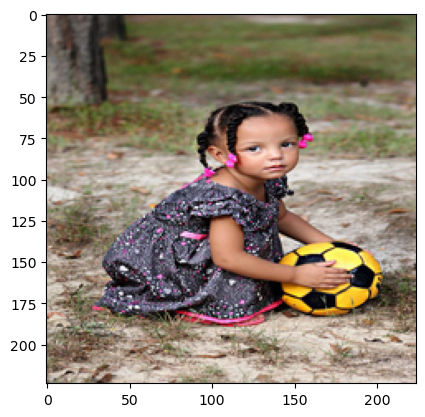

Predicted caption:
 a little boy sitting on a bench with a stuffed animal end



In [163]:
translate("test/Image1.png")

1/1 [==============================] - 0s 129ms/step


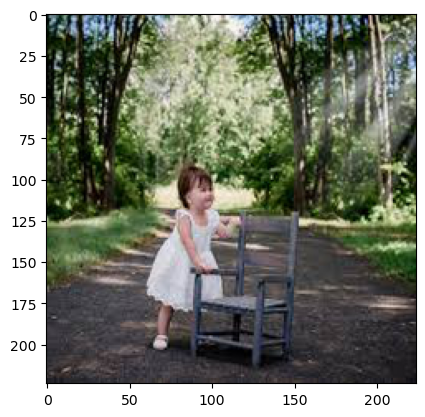

Predicted caption:
 a giraffe standing in a grassy field next to a tree end



In [164]:
translate("test/Image2.png")

1/1 [==============================] - 0s 81ms/step


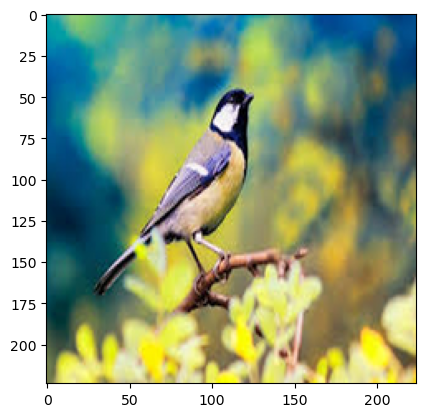

Predicted caption:
 a bird with a red beak is perched on a branch end



In [169]:
translate("test/Image6.jpg")

1/1 [==============================] - 0s 190ms/step


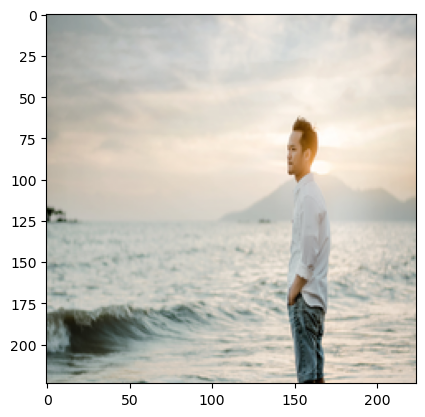

Predicted caption:
 a man in a wet suit on a surfboard in the ocean end



In [174]:
translate("test/Image7.jpg")

# Rishab's File


In [111]:
import tensorflow as tf

# You'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle

In [113]:
len(annotations)

591753

In [115]:
annotations[1000]

{'image_id': 69236,
 'id': 27851,
 'caption': 'Benches are next to a bush in a lighted park'}

In [118]:
PATH = '/Users/cherilyogi/Desktop/coco/train2017'

In [120]:
for i, annot in enumerate(annotations):
    annot = annotations[i]
    caption = '<start> ' + annot['caption'] + ' <end>'
    image_id = annot['image_id']
    full_coco_image_path = PATH + '/' + '%012d.jpg' % (image_id)
    print(i, image_id, caption)
    if i > 500:
        break

0 203564 <start> A bicycle replica with a clock as the front wheel. <end>
1 322141 <start> A room with blue walls and a white sink and door. <end>
2 16977 <start> A car that seems to be parked illegally behind a legally parked car <end>
3 106140 <start> A large passenger airplane flying through the air. <end>
4 106140 <start> There is a GOL plane taking off in a partly cloudy sky. <end>
5 322141 <start> Blue and white color scheme in a small bathroom. <end>
6 322141 <start> This is a blue and white bathroom with a wall sink and a lifesaver on the wall. <end>
7 322141 <start> A blue boat themed bathroom with a life preserver on the wall <end>
8 203564 <start> The bike has a clock as a tire. <end>
9 16977 <start> two cars parked on the sidewalk on the street <end>
10 106140 <start> An airplane that is, either, landing or just taking off. <end>
11 322141 <start> A bathroom with walls that are painted baby blue. <end>
12 571635 <start> A bathroom with a toilet, sink, and shower. <end>
13 3

In [121]:
from tqdm import tqdm

# Store captions and image names in vectors
all_captions = []
all_img_name_vector = []

with tqdm(total=len(annotations), position=0) as pbar:
    for i, annot in enumerate(annotations):
        caption = '<start> ' + annot['caption'] + ' <end>'
        image_id = annot['image_id']
        
        full_coco_image_path = PATH + '/' + '%012d.jpg' % (image_id)
        
        pbar.update(1)

        all_img_name_vector.append(full_coco_image_path)
        all_captions.append(caption)
        
# Shuffle captions and image_names together
# Set a random state
train_captions, img_name_vector = shuffle(all_captions,
                                          all_img_name_vector,
                                          random_state=1)

100%|██████████████████████████████| 591753/591753 [00:00<00:00, 1525459.01it/s]


In [122]:
len(train_captions), len(all_captions)

(591753, 591753)

# Preprocessing the images using InceptionV3

In [123]:
def load_image(image_path):
    #print('load_image: ', image_path)
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

In [124]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

87910968/87910968 [==============================] - 36s 0us/step


In [125]:
image_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_3[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalizati

 conv2d_11 (Conv2D)          (None, None, None, 32)       6144      ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, None, None, 64)       192       ['conv2d_5[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, None, None, 64)       192       ['conv2d_7[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, None, None, 96)       288       ['conv2d_10[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_17 (Activation)  (None, None, None, 96)       0         ['batch_normalization_17[0][0]
                                                                    ']                            
                                                                                                  
 activation_18 (Activation)  (None, None, None, 64)       0         ['batch_normalization_18[0][0]
                                                                    ']                            
                                                                                                  
 mixed1 (Concatenate)        (None, None, None, 288)      0         ['activation_12[0][0]',       
                                                                     'activation_14[0][0]',       
                                                                     'activation_17[0][0]',       
          

                                                                                                  
 conv2d_28 (Conv2D)          (None, None, None, 96)       55296     ['activation_27[0][0]']       
                                                                                                  
 batch_normalization_28 (Ba  (None, None, None, 96)       288       ['conv2d_28[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_28 (Activation)  (None, None, None, 96)       0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, None, None, 384)      995328    ['mixed2[0][0]']              
          

 conv2d_30 (Conv2D)          (None, None, None, 192)      147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_33 (Conv2D)          (None, None, None, 192)      172032    ['activation_32[0][0]']       
                                                                                                  
 conv2d_38 (Conv2D)          (None, None, None, 192)      172032    ['activation_37[0][0]']       
                                                                                                  
 conv2d_39 (Conv2D)          (None, None, None, 192)      147456    ['average_pooling2d_3[0][0]'] 
                                                                                                  
 batch_normalization_30 (Ba  (None, None, None, 192)      576       ['conv2d_30[0][0]']           
 tchNormalization)                                                                                
          

                                                                    ']                            
                                                                                                  
 average_pooling2d_4 (Avera  (None, None, None, 768)      0         ['mixed4[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_40 (Conv2D)          (None, None, None, 192)      147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_43 (Conv2D)          (None, None, None, 192)      215040    ['activation_42[0][0]']       
                                                                                                  
 conv2d_48 (Conv2D)          (None, None, None, 192)      215040    ['activation_47[0][0]']       
          

                                                                                                  
 activation_52 (Activation)  (None, None, None, 160)      0         ['batch_normalization_52[0][0]
                                                                    ']                            
                                                                                                  
 activation_57 (Activation)  (None, None, None, 160)      0         ['batch_normalization_57[0][0]
                                                                    ']                            
                                                                                                  
 average_pooling2d_5 (Avera  (None, None, None, 768)      0         ['mixed5[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_50

 batch_normalization_62 (Ba  (None, None, None, 192)      576       ['conv2d_62[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_67 (Ba  (None, None, None, 192)      576       ['conv2d_67[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_62 (Activation)  (None, None, None, 192)      0         ['batch_normalization_62[0][0]
                                                                    ']                            
                                                                                                  
 activation_67 (Activation)  (None, None, None, 192)      0         ['batch_normalization_67[0][0]
          

                                                                                                  
 conv2d_71 (Conv2D)          (None, None, None, 320)      552960    ['activation_70[0][0]']       
                                                                                                  
 conv2d_75 (Conv2D)          (None, None, None, 192)      331776    ['activation_74[0][0]']       
                                                                                                  
 batch_normalization_71 (Ba  (None, None, None, 320)      960       ['conv2d_71[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_75 (Ba  (None, None, None, 192)      576       ['conv2d_75[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_82 (Activation)  (None, None, None, 384)      0         ['batch_normalization_82[0][0]
                                                                    ']                            
                                                                                                  
 activation_83 (Activation)  (None, None, None, 384)      0         ['batch_normalization_83[0][0]
                                                                    ']                            
                                                                                                  
 batch_normalization_84 (Ba  (None, None, None, 192)      576       ['conv2d_84[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                                                  
 activation_88 (Activation)  (None, None, None, 384)      0         ['batch_normalization_88[0][0]
                                                                    ']                            
                                                                                                  
 activation_91 (Activation)  (None, None, None, 384)      0         ['batch_normalization_91[0][0]
                                                                    ']                            
                                                                                                  
 activation_92 (Activation)  (None, None, None, 384)      0         ['batch_normalization_92[0][0]
                                                                    ']                            
                                                                                                  
 batch_nor

## Caching the features extracted from InceptionV3
Let's pre-process each image with InceptionV3 and cache the output to disk. 



In [126]:
len(img_name_vector)

591753

In [132]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(256)

for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())


100%|███████████████████████████████████████| 463/463 [1:08:04<00:00,  8.82s/it]


In [133]:
image_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

## Preprocess and tokenize the captions

In [134]:
len(train_captions), len(img_name_vector)

(591753, 591753)

In [135]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [136]:
# Choose the top 5000 words from the vocabulary
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [137]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [138]:
# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [139]:
# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [140]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)
max_length

52

## Splitting the data into training and testing

In [141]:
len(img_name_vector)

591753

In [142]:
len(cap_vector)

591753

In [143]:
# Create training and validation sets using an 80-20 split
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)

## Creating a `tf.data` dataset for training
Let's create a `tf.data` dataset to use for training our model.

In [148]:
# You can change these parameters according to your system's configuration
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 64
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [149]:
# Load the numpy files
def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    return img_tensor, cap

In [150]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## Bahdenau Attention Model

We will use a Bahdanau Attention model (a.k.a. *additive Attention*) decoder. The model architecture is from [here]((https://arxiv.org/pdf/1502.03044.pdf)).

Let's extract features from the lower convolutional layer of InceptionV3, giving us a vector of shape (8, 8, 2048).

Then squash that to a shape of (64, 2048).

This vector is then passed through the CNN Encoder (which consists of a single Fully connected layer).

We will use a GRU RNN to attend over the image and predict the next word.

In [151]:
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

        # hidden shape == (batch_size, hidden_size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # score shape == (batch_size, 64, hidden_size)
        score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

        # attention_weights shape == (batch_size, 64, 1)
        # you get 1 at the last axis because you are applying score to self.V
        attention_weights = tf.nn.softmax(self.V(score), axis=1)

        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

In [152]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [153]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.units = units

        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)

    def call(self, x, features, hidden):
        # defining attention as a separate model
        context_vector, attention_weights = self.attention(features, hidden)

        # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)

        # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # passing the concatenated vector to the GRU
        output, state = self.gru(x)

        # shape == (batch_size, max_length, hidden_size)
        x = self.fc1(output)

        # x shape == (batch_size * max_length, hidden_size)
        x = tf.reshape(x, (-1, x.shape[2]))

        # output shape == (batch_size * max_length, vocab)
        x = self.fc2(x)

        return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [154]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [155]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

In [156]:
#checkpoint_path = "data/training_checkpoints/inception"
checkpoint_path = 'coco/newcheck/inception'
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [157]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

In [158]:
loss_plot = []

In [159]:
@tf.function
def train_step(img_tensor, target):
    loss = 0

    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            # passing the features through the decoder
            predictions, hidden, _ = decoder(dec_input, features, hidden)

            loss += loss_function(target[:, i], predictions)

            # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))
    trainable_variables = encoder.trainable_variables + decoder.trainable_variables
    gradients = tape.gradient(loss, trainable_variables)
    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

In [163]:
EPOCHS = 5

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 0.4622
Epoch 1 Batch 100 Loss 0.5124
Epoch 1 Batch 200 Loss 0.5637
Epoch 1 Batch 300 Loss 0.5526
Epoch 1 Batch 400 Loss 0.5637
Epoch 1 Batch 500 Loss 0.5393
Epoch 1 Batch 600 Loss 0.5169
Epoch 1 Batch 700 Loss 0.6852
Epoch 1 Batch 800 Loss 0.5232
Epoch 1 Batch 900 Loss 0.5723
Epoch 1 Batch 1000 Loss 0.5545
Epoch 1 Batch 1100 Loss 0.5749
Epoch 1 Batch 1200 Loss 0.5205
Epoch 1 Batch 1300 Loss 0.5562
Epoch 1 Batch 1400 Loss 0.5495
Epoch 1 Batch 1500 Loss 0.5337
Epoch 1 Batch 1600 Loss 0.5264
Epoch 1 Batch 1700 Loss 0.5142
Epoch 1 Batch 1800 Loss 0.5796
Epoch 1 Batch 1900 Loss 0.5569
Epoch 1 Batch 2000 Loss 0.5771
Epoch 1 Batch 2100 Loss 0.5453
Epoch 1 Batch 2200 Loss 0.5599
Epoch 1 Batch 2300 Loss 0.6153
Epoch 1 Batch 2400 Loss 0.5428
Epoch 1 Batch 2500 Loss 0.5921
Epoch 1 Batch 2600 Loss 0.5502
Epoch 1 Batch 2700 Loss 0.5530
Epoch 1 Batch 2800 Loss 0.5401
Epoch 1 Batch 2900 Loss 0.6217
Epoch 1 Batch 3000 Loss 0.5521
Epoch 1 Batch 3100 Loss 0.4861
Epoch 1 Batch 3200 L

Epoch 4 Batch 3800 Loss 0.4950
Epoch 4 Batch 3900 Loss 0.4924
Epoch 4 Batch 4000 Loss 0.4924
Epoch 4 Batch 4100 Loss 0.5233
Epoch 4 Batch 4200 Loss 0.5617
Epoch 4 Batch 4300 Loss 0.5063
Epoch 4 Batch 4400 Loss 0.5126
Epoch 4 Batch 4500 Loss 0.5161
Epoch 4 Batch 4600 Loss 0.5382
Epoch 4 Batch 4700 Loss 0.4650
Epoch 4 Batch 4800 Loss 0.5611
Epoch 4 Batch 4900 Loss 0.5849
Epoch 4 Batch 5000 Loss 0.5281
Epoch 4 Batch 5100 Loss 0.5446
Epoch 4 Batch 5200 Loss 0.5446
Epoch 4 Batch 5300 Loss 0.4873
Epoch 4 Batch 5400 Loss 0.5006
Epoch 4 Batch 5500 Loss 0.5069
Epoch 4 Batch 5600 Loss 0.4944
Epoch 4 Batch 5700 Loss 0.5578
Epoch 4 Batch 5800 Loss 0.5171
Epoch 4 Batch 5900 Loss 0.5203
Epoch 4 Batch 6000 Loss 0.5495
Epoch 4 Batch 6100 Loss 0.5815
Epoch 4 Batch 6200 Loss 0.5079
Epoch 4 Batch 6300 Loss 0.4981
Epoch 4 Batch 6400 Loss 0.5347
Epoch 4 Batch 6500 Loss 0.5333
Epoch 4 Batch 6600 Loss 0.5650
Epoch 4 Batch 6700 Loss 0.5713
Epoch 4 Batch 6800 Loss 0.5017
Epoch 4 Batch 6900 Loss 0.5248
Epoch 4 

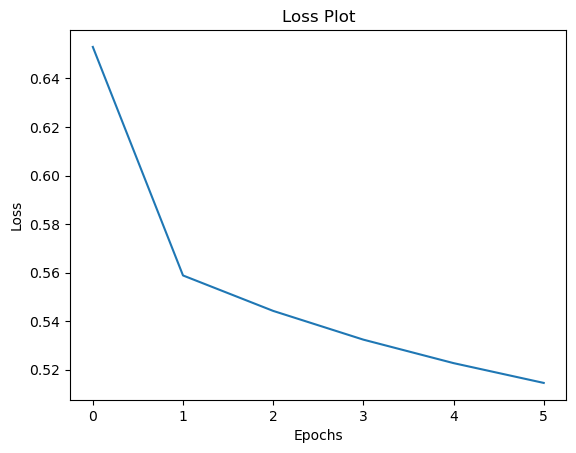

In [164]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

# Inference


In [165]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [166]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

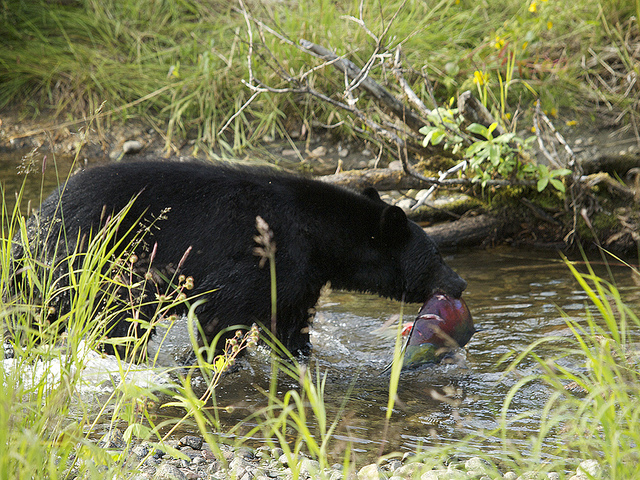

In [169]:
Image.open(image)

Real Caption: <start> a black bear in a stream with a fish in its mouth <end>
Prediction Caption: a black bear walking in the woods next to a body of water <end>


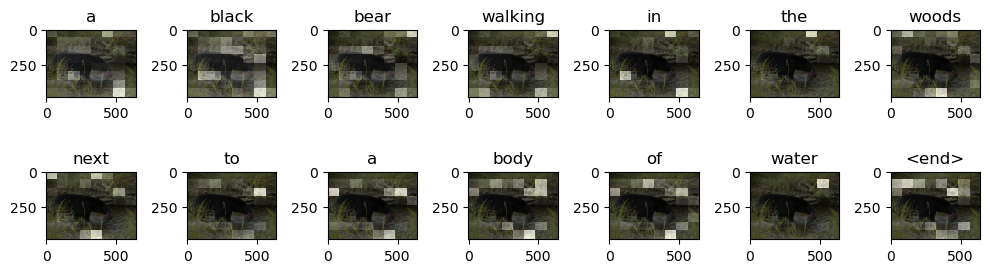

/Users/cherilyogi/Desktop/coco/train2017/000000138239.jpg


In [168]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)
print(image)

24662/24662 [==============================] - 0s 0us/step
Prediction caption: a man wet dogs at a beach <end>


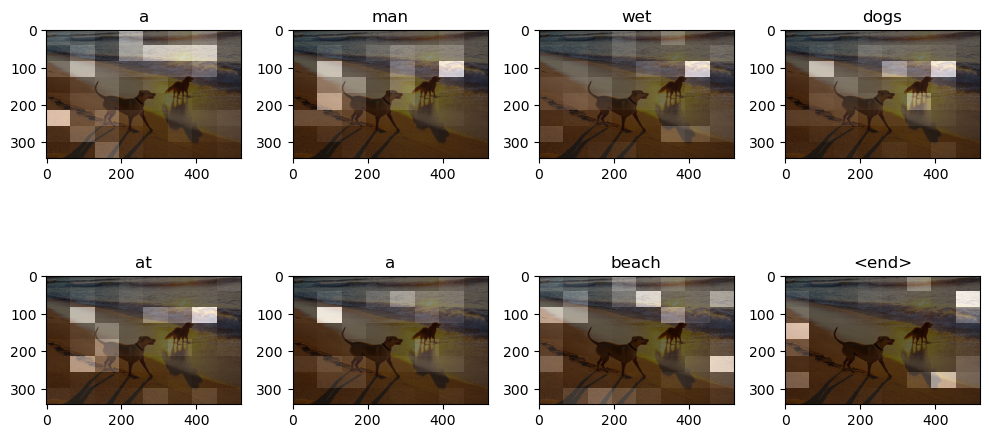

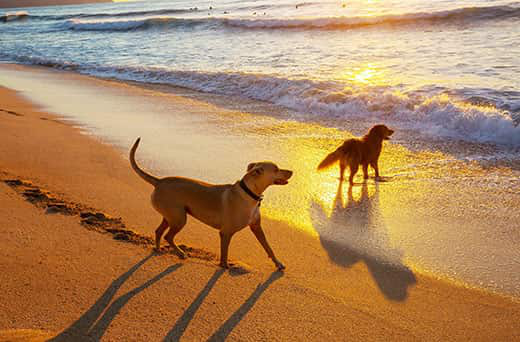

In [170]:
image_url = 'https://www.hillspet.com/content/dam/cp-sites/hills/hills-pet/en_us/exported/dog-care/Skyword/images/two-dogs-on-beach-at-sunset-SW.jpg'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     origin=image_url)
        
result, attention_plot = evaluate(image_path)
print ('Prediction caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)

# opening the image and compare translation with the image itself
Image.open(image_path)

Prediction caption: a group of people relaxing on skis holds snowboards <end>
Original captions:
A snowboarder sits on a slope with skiers and boarders nearby
A snowboarder takes a rest on the mountainside
Snowboarders sitting in the snow while skiers take the hill
The snowboarder is sitting down
Two skiers stand , two sit on slopes


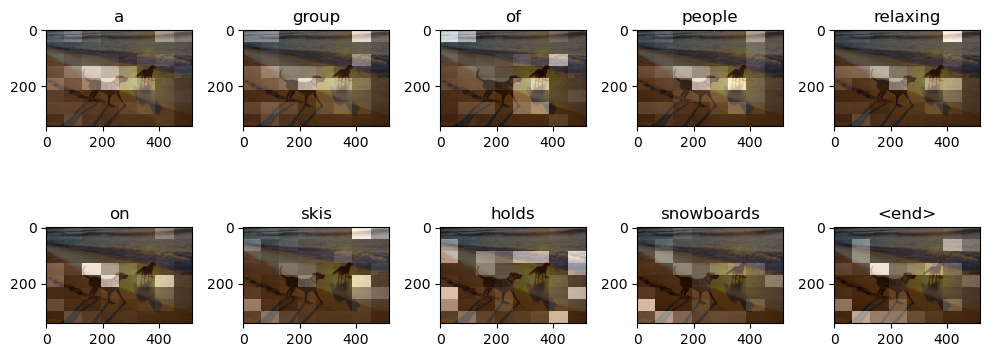

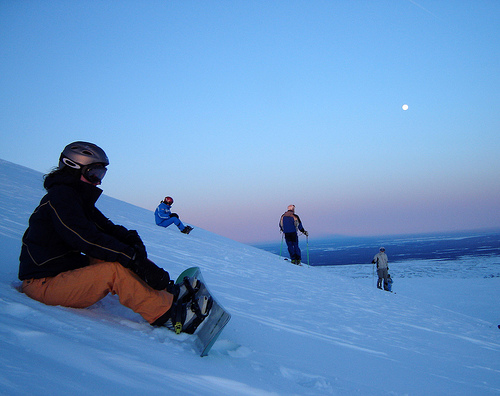

In [173]:
dogs_filename = 'flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/113678030_87a6a6e42e.jpg'
#dogs_caption = image_caption[100][1]
        
result, attention_plot = evaluate(dogs_filename)
print ('Prediction caption:', ' '.join(result))
#print ('Original caption:', ' '.join(dogs_caption))
# Manually, by opening the captions file /Users/dino/Documents/info7610/flickr8k/Flickr8k_text/Flickr8k.token.txt:
print("Original captions:")
print("A snowboarder sits on a slope with skiers and boarders nearby")
print("A snowboarder takes a rest on the mountainside")
print("Snowboarders sitting in the snow while skiers take the hill")
print("The snowboarder is sitting down")
print("Two skiers stand , two sit on slopes")
plot_attention(image_path, result, attention_plot)

# opening the image and compare translation with the image itself
Image.open(dogs_filename)

In [176]:
pwd

'/Users/cherilyogi/Desktop/coco'

Prediction caption: a dog with some a very large yard <end>


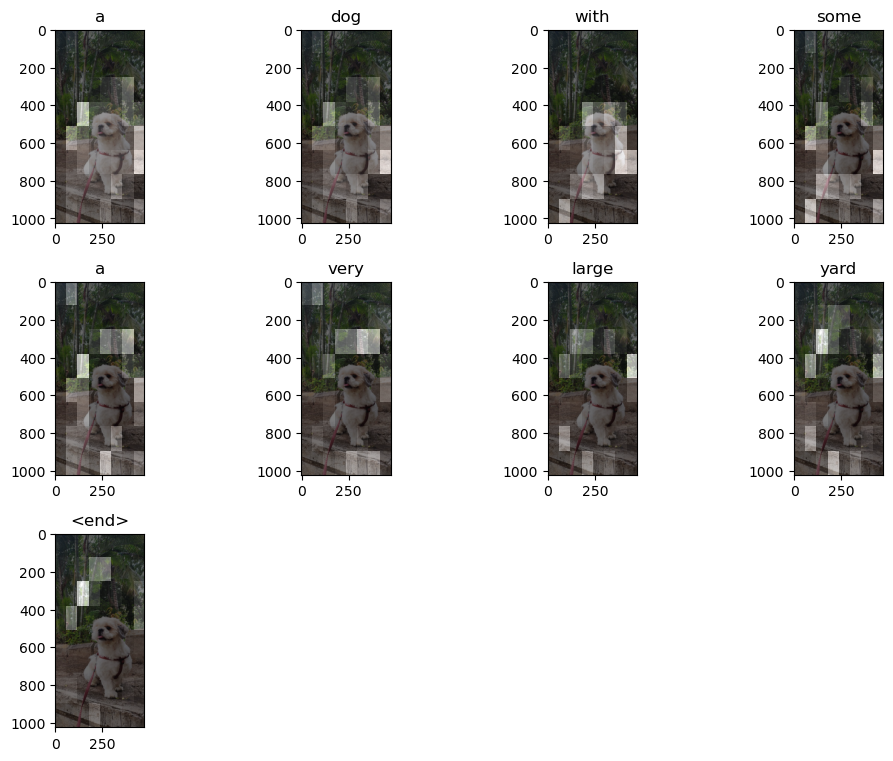

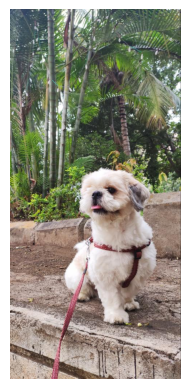

Prediction caption: a brown and black dog laying down an empty track <end>


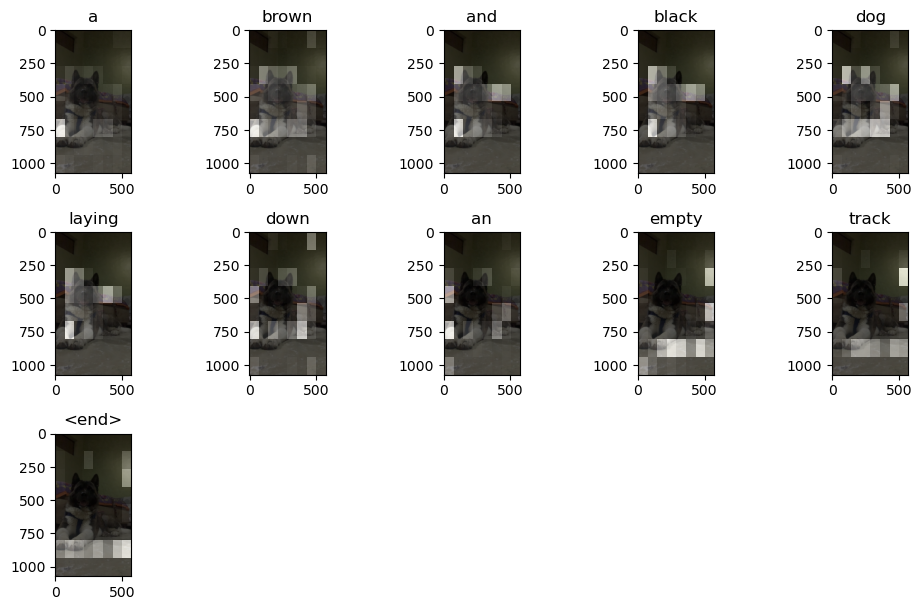

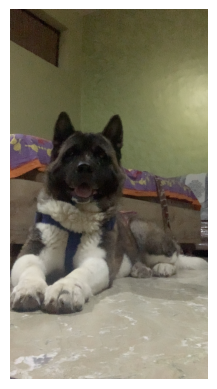

Prediction caption: there are three containers of various fruits <end>


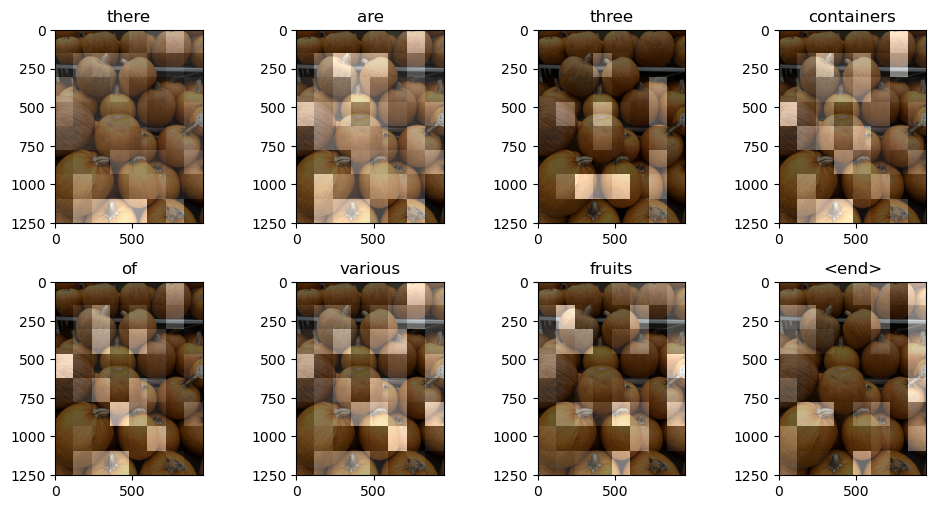

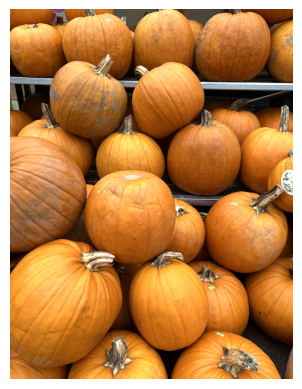

Prediction caption: a child topped with fruit including a bird sitting in a room <end>


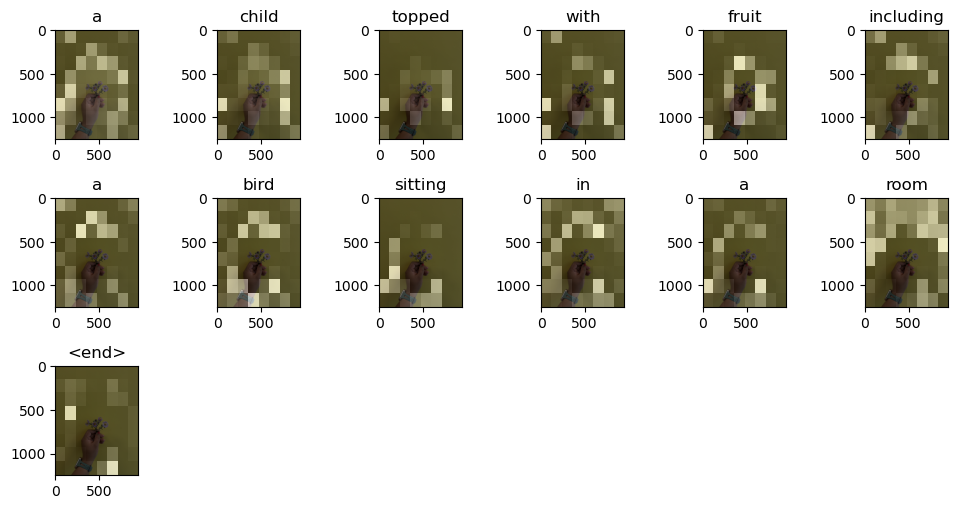

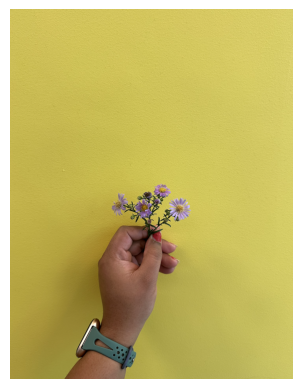

Prediction caption: three people in blue striped shirt and a white frisbee in the water <end>


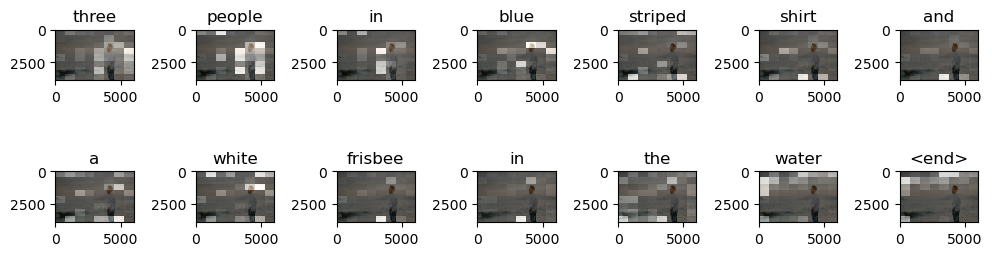

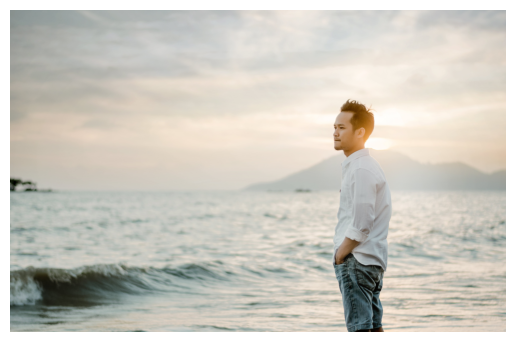

Prediction caption: a small bird looking at a tree branch in a tree <end>


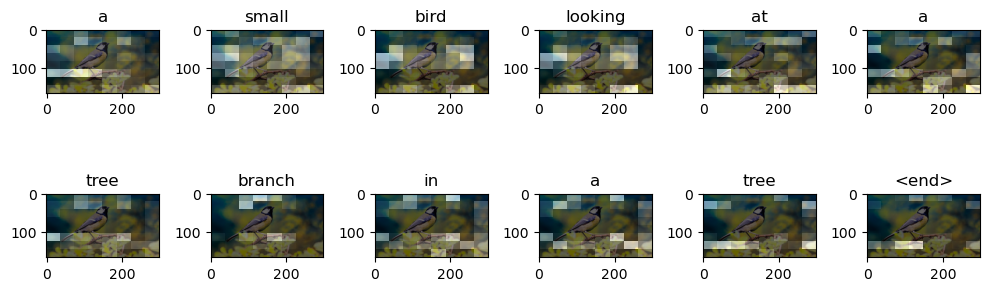

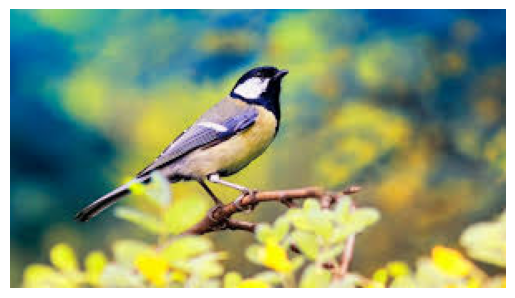

Prediction caption: a small toddler is reaching out to eat glide on the beach <end>


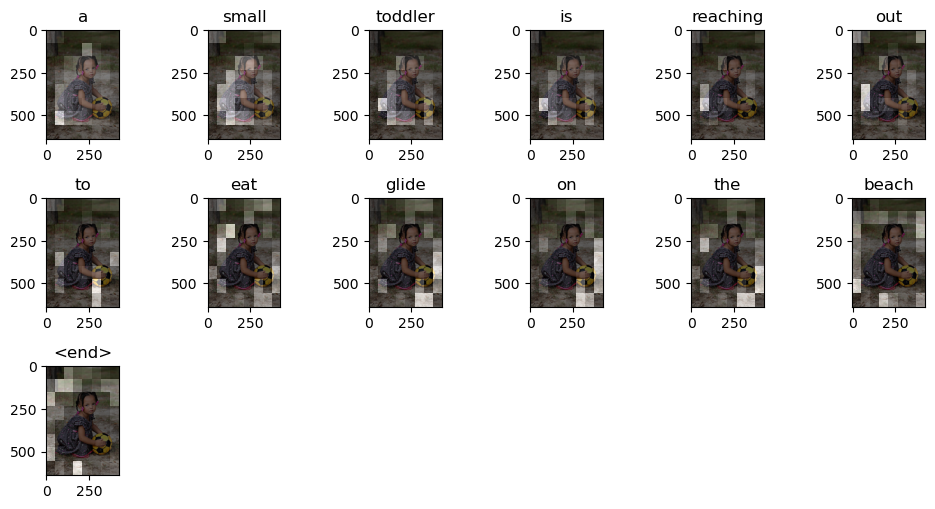

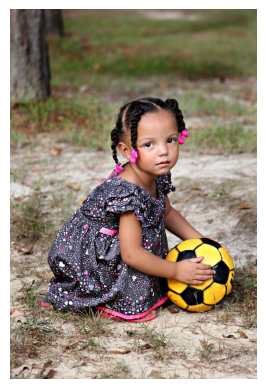

Prediction caption: there are people sit on a bench <end>


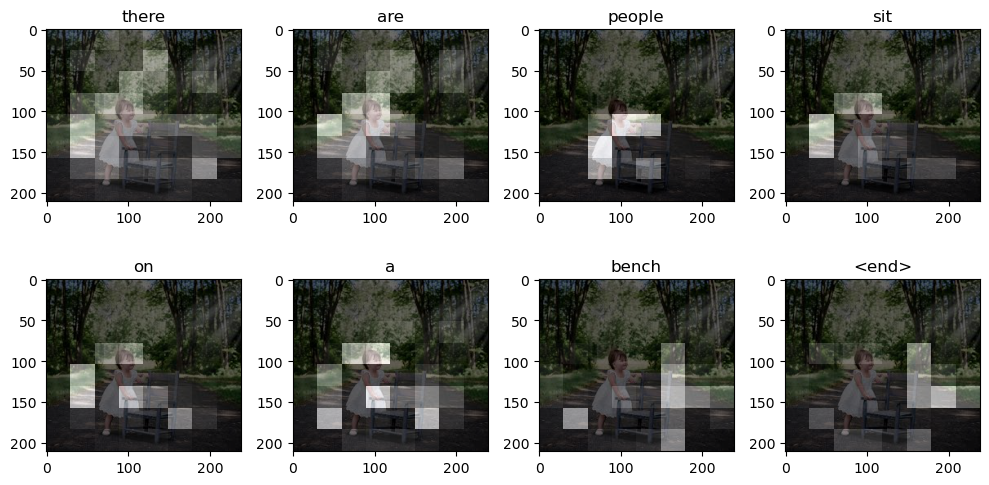

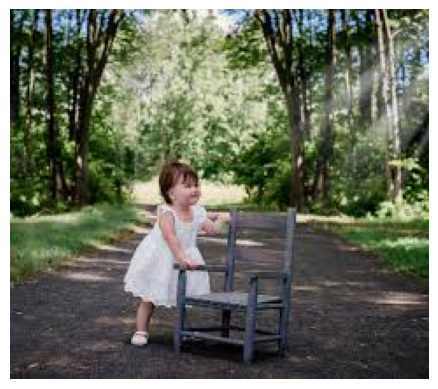

In [195]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory containing your images
image_directory = '/Users/cherilyogi/Desktop/coco/test'

# Get a list of all image file names in the directory
image_filenames = [filename for filename in os.listdir(image_directory) if filename.endswith('.jpg')]

# Iterate through each image file
for image_filename in image_filenames:
    # Construct the full path to the image file
    test_filename = os.path.join(image_directory, image_filename)

    # Process the image and generate captions
    result, attention_plot = evaluate(test_filename)
    print('Prediction caption:', ' '.join(result))

    # Plot the attention and show the image
    plot_attention(test_filename, result, attention_plot)

    # Open and display the image
    img = Image.open(test_filename)
    plt.imshow(img)
    plt.axis('off')
    plt.show()


# Changes in the above code to make it more better 

In [196]:
import tensorflow as tf
import time

# Hyperparameters
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_epochs = 5

# Models and optimizer
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001) 
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

# Checkpoint setup
checkpoint_path = 'coco/inception2'
ckpt = tf.train.Checkpoint(encoder=encoder, decoder=decoder, optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# Assuming you have implemented your dataset loading function
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Define your training step function
@tf.function
@tf.function
def train_step(img_tensor, target):
    loss = 0

    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        # Ensure predictions is defined even if the loop doesn't run
        predictions = None

        for i in range(1, target.shape[1]):
            # passing the features through the decoder
            predictions, hidden, _ = decoder(dec_input, features, hidden)  

            loss += loss_function(target[:, i], predictions)

            # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

    if predictions is not None:
        total_loss = (loss / int(target.shape[1]))
        trainable_variables = encoder.trainable_variables + decoder.trainable_variables
        gradients = tape.gradient(loss, trainable_variables)
        optimizer.apply_gradients(zip(gradients, trainable_variables))

        return loss, total_loss
    else:
        # Handle the case where the loop didn't run (e.g., target sequence length is 1)
        return 0, 0

# Training loop
for epoch in range(num_epochs):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print('Epoch {} Batch {} Loss {:.4f}'.format(epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))

    # Save the model checkpoint every 5 epochs
    if epoch % 5 == 0:
        ckpt_manager.save()

    print('Epoch {} Loss {:.6f}'.format(epoch + 1, total_loss / num_steps))
    print('Time taken for 1 epoch {} sec\n'.format(time.time() - start))


Epoch 1 Batch 0 Loss 1.9239
Epoch 1 Batch 100 Loss 1.0538
Epoch 1 Batch 200 Loss 1.0187
Epoch 1 Batch 300 Loss 0.8402
Epoch 1 Batch 400 Loss 0.8397
Epoch 1 Batch 500 Loss 0.8287
Epoch 1 Batch 600 Loss 0.7201
Epoch 1 Batch 700 Loss 0.7513
Epoch 1 Batch 800 Loss 0.7633
Epoch 1 Batch 900 Loss 0.7063
Epoch 1 Batch 1000 Loss 0.7148
Epoch 1 Batch 1100 Loss 0.6789
Epoch 1 Batch 1200 Loss 0.7343
Epoch 1 Batch 1300 Loss 0.6829
Epoch 1 Batch 1400 Loss 0.6995
Epoch 1 Batch 1500 Loss 0.6630
Epoch 1 Batch 1600 Loss 0.6564
Epoch 1 Batch 1700 Loss 0.6817
Epoch 1 Batch 1800 Loss 0.6734
Epoch 1 Batch 1900 Loss 0.7275
Epoch 1 Batch 2000 Loss 0.6612
Epoch 1 Batch 2100 Loss 0.5885
Epoch 1 Batch 2200 Loss 0.6344
Epoch 1 Batch 2300 Loss 0.6310
Epoch 1 Batch 2400 Loss 0.6135
Epoch 1 Batch 2500 Loss 0.6112
Epoch 1 Batch 2600 Loss 0.6381
Epoch 1 Batch 2700 Loss 0.5652
Epoch 1 Batch 2800 Loss 0.5889
Epoch 1 Batch 2900 Loss 0.6861
Epoch 1 Batch 3000 Loss 0.6285
Epoch 1 Batch 3100 Loss 0.5451
Epoch 1 Batch 3200 L

Epoch 4 Batch 3800 Loss 0.5743
Epoch 4 Batch 3900 Loss 0.4995
Epoch 4 Batch 4000 Loss 0.6209
Epoch 4 Batch 4100 Loss 0.5365
Epoch 4 Batch 4200 Loss 0.5560
Epoch 4 Batch 4300 Loss 0.5636
Epoch 4 Batch 4400 Loss 0.5007
Epoch 4 Batch 4500 Loss 0.5378
Epoch 4 Batch 4600 Loss 0.5596
Epoch 4 Batch 4700 Loss 0.5381
Epoch 4 Batch 4800 Loss 0.5129
Epoch 4 Batch 4900 Loss 0.5221
Epoch 4 Batch 5000 Loss 0.4883
Epoch 4 Batch 5100 Loss 0.5549
Epoch 4 Batch 5200 Loss 0.5908
Epoch 4 Batch 5300 Loss 0.5317
Epoch 4 Batch 5400 Loss 0.5010
Epoch 4 Batch 5500 Loss 0.5262
Epoch 4 Batch 5600 Loss 0.5318
Epoch 4 Batch 5700 Loss 0.4948
Epoch 4 Batch 5800 Loss 0.5396
Epoch 4 Batch 5900 Loss 0.6247
Epoch 4 Batch 6000 Loss 0.5311
Epoch 4 Batch 6100 Loss 0.5887
Epoch 4 Batch 6200 Loss 0.5554
Epoch 4 Batch 6300 Loss 0.5975
Epoch 4 Batch 6400 Loss 0.5438
Epoch 4 Batch 6500 Loss 0.5135
Epoch 4 Batch 6600 Loss 0.4899
Epoch 4 Batch 6700 Loss 0.5235
Epoch 4 Batch 6800 Loss 0.5042
Epoch 4 Batch 6900 Loss 0.5107
Epoch 4 

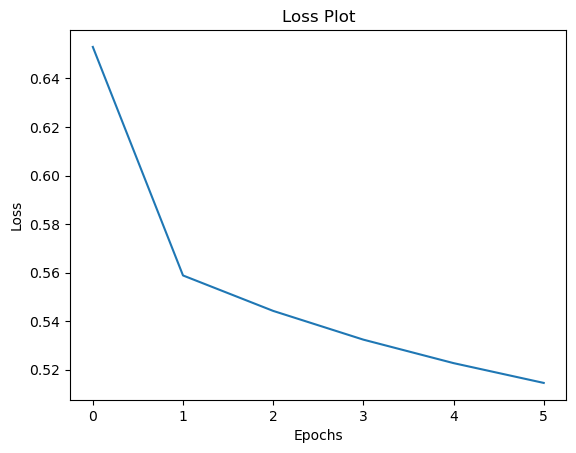

In [197]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Prediction caption: the group of people on a table eating <end>


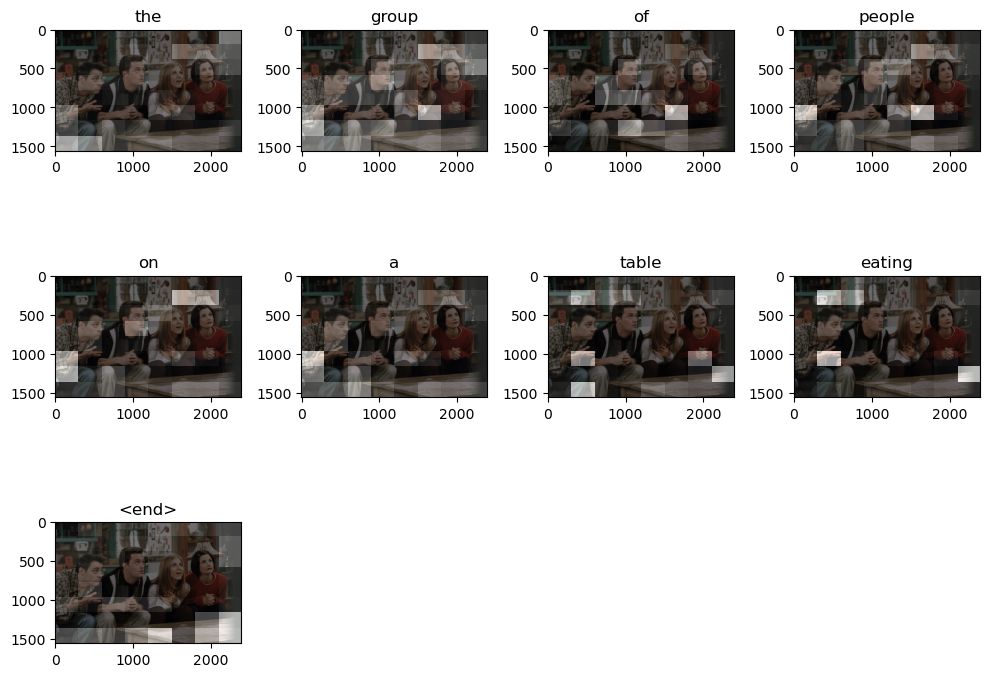

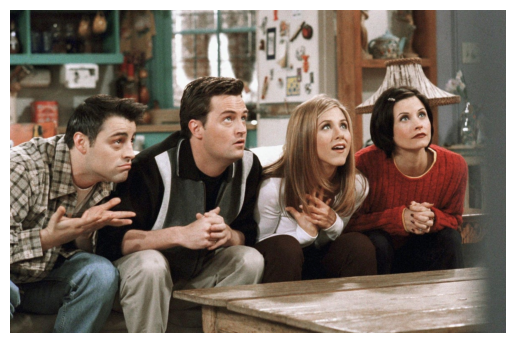

In [279]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory containing your images
image_directory = '/Users/cherilyogi/Desktop/coco/test'

# Get a list of all image file names in the directory
image_filenames = [filename for filename in os.listdir(image_directory) if filename.endswith('.jpg')]

# Iterate through each image file
for image_filename in image_filenames:
    # Construct the full path to the image file
    test_filename = os.path.join(image_directory, image_filename)

    # Process the image and generate captions
    result, attention_plot = evaluate(test_filename)
    print('Prediction caption:', ' '.join(result))

    # Plot the attention and show the image
    plot_attention(test_filename, result, attention_plot)

    # Open and display the image
    img = Image.open(test_filename)
    plt.imshow(img)
    plt.axis('off')
    plt.show()


Prediction caption: two men and women sitting in the candles on a table in front of a variety of pizza ovens <end>


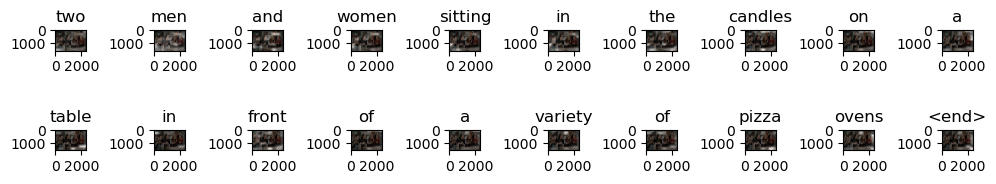

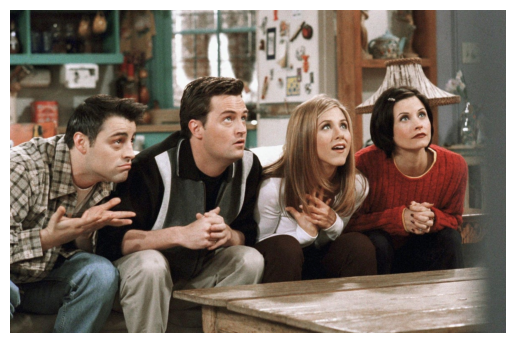

In [267]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory containing your images
image_directory = '/Users/cherilyogi/Desktop/coco/test'

# Get a list of all image file names in the directory
image_filenames = [filename for filename in os.listdir(image_directory) if filename.endswith('.jpg')]

# Iterate through each image file
for image_filename in image_filenames:
    # Construct the full path to the image file
    test_filename = os.path.join(image_directory, image_filename)

    # Process the image and generate captions
    result, attention_plot = evaluate(test_filename)
    print('Prediction caption:', ' '.join(result))

    # Plot the attention and show the image
    plot_attention(test_filename, result, attention_plot)

    # Open and display the image
    img = Image.open(test_filename)
    plt.imshow(img)
    plt.axis('off')
    plt.show()


Prediction caption: a group of men and girls sitting around a street eating food <end>


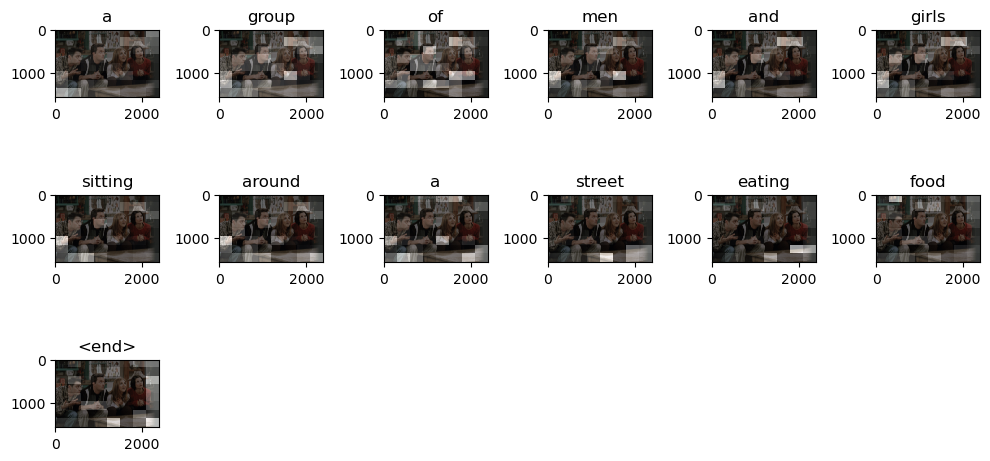

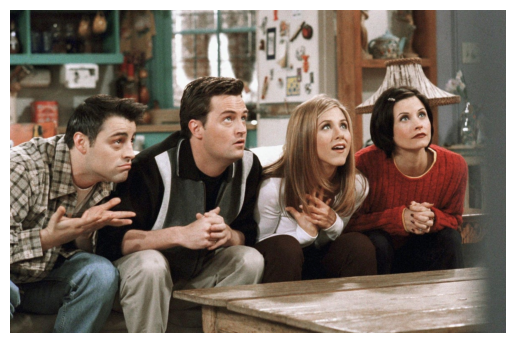

In [277]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Specify the directory containing your images
image_directory = '/Users/cherilyogi/Desktop/coco/test'

# Get a list of all image file names in the directory
image_filenames = [filename for filename in os.listdir(image_directory) if filename.endswith('.jpg')]

# Iterate through each image file
for image_filename in image_filenames:
    # Construct the full path to the image file
    test_filename = os.path.join(image_directory, image_filename)

    # Process the image and generate captions
    result, attention_plot = evaluate(test_filename)
    print('Prediction caption:', ' '.join(result))

    # Plot the attention and show the image
    plot_attention(test_filename, result, attention_plot)

    # Open and display the image
    img = Image.open(test_filename)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
